# Test Deforestation classifers in Styx, Tasmania

In [1]:
#General
import glob
import xarray as xr
import rioxarray
import pandas as pd
import geopandas as gpd
import numpy as np
from rasterio import features
from pyproj import Transformer

from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

#DEA tools
import sys
sys.path.insert(1, '../Tools/')
from dea_tools.datahandling import paths_to_datetimeindex, load_ard
from dea_tools.plotting import rgb, display_map
from datacube.utils.cog import write_cog
from dea_tools.spatial import xr_rasterize

#Planetary computer
import pystac_client
import planetary_computer
import matplotlib.pyplot as plt

import datacube
import odc.stac
import odc.geo.xr
from odc.geo.geom import BoundingBox

### Load satellite input dataset
Sentinel1-rct (band-c) with features vv and vh, from the planetary computer

In [2]:
#Connect to datacube
dc = datacube.Datacube(app="Planetary_computer")

In [3]:
# Define the area of interest styx pre site selection (1220840.0143, 1258259.6732) (-4742005.5336,-4762156.5046) EPSG:3577
#longitude =  (1220840.0143, 1258259.6732) #EPSG:3577 VS EPSG:4326 (146.5001688,146.9685348)
#latitude = (-4742005.5336,-4762156.5046) #EPSG:3577 VS EPSG:4326 (-42.7492325,-42.8950499)

# Create a transformer from EPSG:3577 to EPSG:4326
transformer = Transformer.from_crs("EPSG:3577", "EPSG:4326", always_xy=True)

#  bounding box coordinates values in CRS EPSG:3577
left_3577, right_3577 = 1220840, 1258260
bottom_3577, top_3577 = -4762157, -4742006

left_4326, bottom_4326 = transformer.transform(left_3577, bottom_3577)
right_4326, top_4326 = transformer.transform(right_3577, top_3577)

left_4326 = round(left_4326, 4)
bottom_4326 = round(bottom_4326, 4)
right_4326 = round(right_4326, 4)
top_4326 = round(top_4326, 4)

print(left_4326,bottom_4326,right_4326,top_4326)

146.5273 -42.9351 146.9406 -42.7093


In [4]:
display_map(x=(left_4326, right_4326), y=(bottom_4326,top_4326))

In [5]:
# Set the range of dates for the analysis
time = {'t2021': ('2021-04-01','2021-04-30'),
        't2022': ('2022-04-01', '2022-04-30'),
        't2023': ('2023-04-01', '2023-04-30'),
        't2024': ('2024-04-01', '2024-04-30')        
       }

In [6]:
# Open a pystack client pointing to the Microsoft Planetary Computer data catalogue
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [14]:
#Sentinel1 Load parameters
time_range = "/".join(time.get('t2024'))

# Convert data-cube style queries into something readable by `pystac_client`

#bbox = BoundingBox.from_xy(longitude, latitude)
bbox = BoundingBox(left_4326, bottom_4326, right_4326, top_4326, crs="EPSG:4326")

# Search for STAC items from "sentinel-1-rtc" product
search = catalog.search(
    collections="sentinel-1-rtc", #C-band
    bbox=bbox,
    datetime= time_range,
)

# Check how many items were returned
items = search.item_collection()
print(f"Found {len(items)} STAC items")

Found 2 STAC items


In [15]:
#load Sentinel1 dataset
dask_chunks = {'x': 1000, 'y': 1000}
#Stac Load 
ds1 = odc.stac.load(
    items,
    bbox=bbox,
    assets=["vh","vv"],
    crs="EPSG:3577",
    resolution=20,
    chunks = dask_chunks
)

# Inspect outputs
ds1

<xarray.Dataset> Size: 42MB
Dimensions:      (y: 1410, x: 1871, time: 2)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2024-04-13T19:18:53.869223 2024-04...
Data variables:
    vh           (time, y, x) float32 21MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    vv           (time, y, x) float32 21MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>

In [16]:
#check available time imagery
ds1.coords['time'].values

array(['2024-04-13T19:18:53.869223000', '2024-04-25T19:18:55.246331000'],
      dtype='datetime64[ns]')

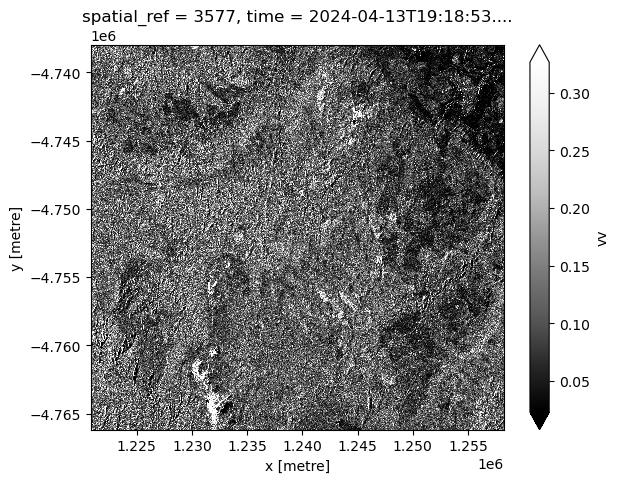

In [17]:
#Visually check Sentinel 1 dataset
ds1.isel(time = [0]).vv.plot(size=5, cmap="Greys_r",robust = True) 

Combine different times imagery into dataset

In [18]:
#First load
#ds_combined = ds1.isel(time = [0]) # run this for the first dataset
#ds_combined = ds_combined.load() #run this for the first dataset: load all data from dask chunks

#subsequent loads (activate this code)
ds1_temporary = ds1.isel(time = [0]) #run this for the subsequent datasets
ds1_temporary = ds1_temporary.load() #run this for the subsequent datasets: load all data from dask chunks
ds_combined = xr.concat([ds_combined, ds1_temporary], dim='time') #run this for the subsequent datasets
del ds1_temporary

#ds_combined times: 2023-04-07T19:18:49.464162 , 2024-04-13T19:18:53.869223000
#ds1.sel(time = '2021-04-05T19:18:38.034485000')

In [19]:
#inspect dataset
ds_combined

<xarray.Dataset> Size: 42MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2023-04-07T19:18:49.464162 2024-04...
Data variables:
    vh           (time, y, x) float32 21MB 0.0267 0.0366 ... 0.03931 0.01848
    vv           (time, y, x) float32 21MB 0.1005 0.0952 ... 0.125 0.1195

Process bands: * band scaling to dB

In [20]:
#convert vv and vh bands to decibel scale
def dB_scale(data): 
    '''Scales a xarray.DataArray with linear DN to a dB scale.'''
    # Explicitly set negative data to nan to avoid log of negative number
    negative_free_data = data.where(data >= 0, np.nan)
    return 10 * np.log10(negative_free_data)

In [21]:
ds_combined["vh_dB"] = dB_scale(ds_combined.vh)
ds_combined["vv_dB"] = dB_scale(ds_combined.vv)

In [52]:
ds_combined

<xarray.Dataset> Size: 84MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2023-04-07T19:18:49.464162 2024-04...
Data variables:
    vh           (time, y, x) float32 21MB 0.0267 0.0366 ... 0.03931 0.01848
    vv           (time, y, x) float32 21MB 0.1005 0.0952 ... 0.125 0.1195
    vh_dB        (time, y, x) float32 21MB -15.73 -14.37 ... -14.05 -17.33
    vv_dB        (time, y, x) float32 21MB -9.979 -10.21 -14.86 ... -9.03 -9.226

In [54]:
ds_combined = ds_combined.drop_vars(['vh','vv'])

In [55]:
ds_combined

<xarray.Dataset> Size: 42MB
Dimensions:      (y: 1410, x: 1871, time: 2)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2023-04-07T19:18:49.464162 2024-04...
Data variables:
    vh_dB        (time, y, x) float32 21MB -15.73 -14.37 ... -14.05 -17.33
    vv_dB        (time, y, x) float32 21MB -9.979 -10.21 -14.86 ... -9.03 -9.226

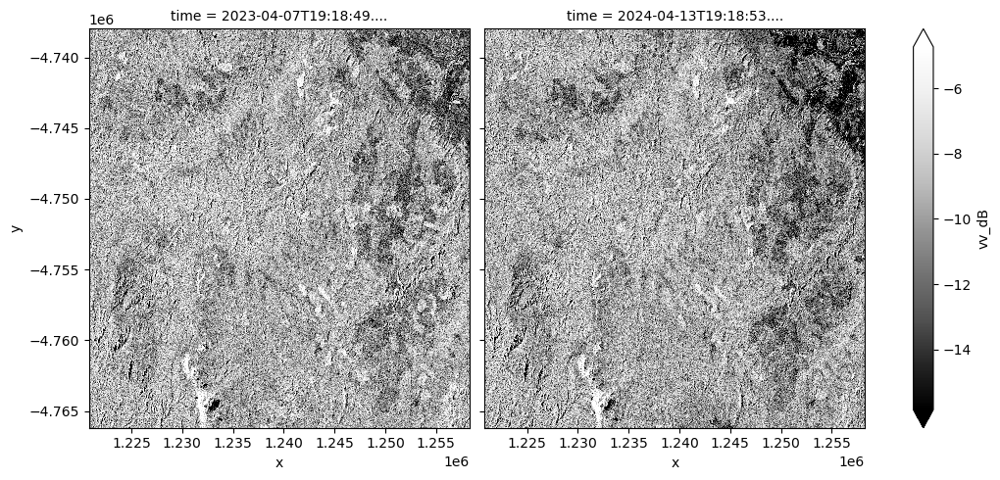

In [23]:
#Visually inspect combined dataset
ds_combined.vv_dB.plot(size=5, cmap="Greys_r",robust = True, col = 'time')

  #ds.vh.sel(time = '2021-04-05T19:18:38.034485000').plot(size=5, cmap="Greys_r",robust = True)

## Import labeled classes dataset

In [24]:
# Load the polygons
class_training_gpd = gpd.read_file('../Project/Inputs/Styx_class_testing_polygons/Tas_deforestation_change_202403_202303_Vectorized_clippedv2.shp')

In [25]:
#inspect imported geopandas dataframe
class_training_gpd

,deforest,Area,geometry
0,1,100,"POLYGON ((1246030.000 -4742060.000, 1246040.00..."
1,1,100,"POLYGON ((1247390.000 -4742060.000, 1247400.00..."
2,0,200,"POLYGON ((1246170.000 -4742080.000, 1246190.00..."
3,0,100,"POLYGON ((1247200.000 -4742080.000, 1247210.00..."
4,1,100,"POLYGON ((1246010.000 -4742090.000, 1246020.00..."
...,...,...,...
369,-1,1310300,"POLYGON ((1247060.000 -4742060.000, 1247180.00..."
370,1,100,"POLYGON ((1245670.000 -4743419.000, 1245670.00..."
371,-1,100,"POLYGON ((1246090.000 -4743419.000, 1246090.00..."
372,1,56300,"POLYGON ((1245690.000 -4743400.000, 1245690.00..."


In [26]:
# clean geodataframe 
class_training_gpd = class_training_gpd.drop(columns=['Area'])
class_training_gpd = class_training_gpd.rename(columns={'deforest': 'deforestation_class'})
class_training_gpd['deforestation_class'] = class_training_gpd['deforestation_class'].replace({-1: 1, 0: 2, 1: 2})

In [27]:
class_training_gpd.deforestation_class.unique()

array([3, 2, 1])

In [131]:
#Visually inspect geopandas dataframe
class_training_gpd.explore(column='deforestation_class')

In [25]:
ds_combined.vv_dB.isel(time = [1]).rio.crs

CRS.from_epsg(3577)

In [28]:
# Rasterize the polygon geometries ('deforestation_class') onto the raster template from the xarray dataset (ds_clipped)
deforestation_raster = xr_rasterize(
    gdf=class_training_gpd,                         # Your geopandas GeoDataFrame
    da=ds_combined.vv_dB.isel(time = [0]),                     # Your xarray DataArray (vv band), used as the template
    attribute_col='deforestation_class',   # Column in polygons to rasterize (e.g., deforestation class)
    crs=ds_combined.vv_dB.isel(time = [0]).rio.crs,                # Coordinate reference system
    name='deforestation_class',                  # Name of the resulting DataArray
    all_touched = False # Set all_touched to False (default) note: assign value to pixel if the center is contain by the polygon geometry
)

In [29]:
deforestation_raster

<xarray.DataArray 'deforestation_class' (y: 1410, x: 1871)> Size: 21MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577

In [30]:
deforestation_dataset_2024_2023 = deforestation_raster.to_dataset(name='deforestation_class')

In [31]:
deforestation_dataset_2024_2023

<xarray.Dataset> Size: 21MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  (y, x) int64 21MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0

In [32]:
np.unique(deforestation_dataset_2024_2023['deforestation_class'].values)

array([0, 1, 2, 3])

In [33]:
#when rasterizing the polygon the nan values are mapped as 0, then it is required to clean them from our dataset
deforestation_dataset_2024_2023['deforestation_class'] = deforestation_dataset_2024_2023['deforestation_class'].where((deforestation_dataset_2024_2023.deforestation_class == 1) | (deforestation_dataset_2024_2023.deforestation_class == 2) | (deforestation_dataset_2024_2023.deforestation_class == 3))

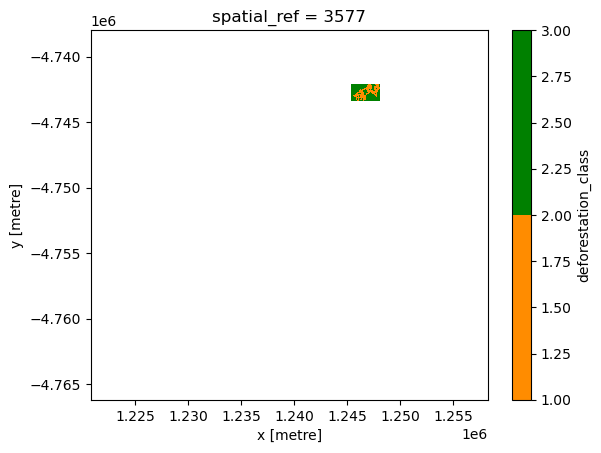

In [34]:
deforestation_dataset_2024_2023['deforestation_class'].plot(cmap=ListedColormap(['darkorange','green']),                                                                                                                                                                                                                 
                                    add_labels=True,
                                    add_colorbar=True)

## Combine reference and satellite datasets

Normal classification: two sentinel1 rct images from 2021 and 2022 will be used to train the RF, then each image will be cliped to the corresponding year reference dataset

In [56]:
# mask sentinel1 dataset (ds_combined) to pixels that have deforestation classes (1,2,3)
mask = 0 #avoid other mask variables to be passed in
mask = (deforestation_dataset_2024_2023.deforestation_class == 1) | (deforestation_dataset_2024_2023.deforestation_class == 2) | (deforestation_dataset_2024_2023.deforestation_class == 3)

deforestation_dataset_2024_2023['deforestation_class'] = deforestation_dataset_2024_2023['deforestation_class'].where(mask)
ds_2024_2023_masked = ds_combined.where(mask)
ds_2024_2023_masked

<xarray.Dataset> Size: 42MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 16B 2023-04-07T19:18:49.464162 2024-04...
Data variables:
    vh_dB        (time, y, x) float32 21MB nan nan nan nan ... nan nan nan nan
    vv_dB        (time, y, x) float32 21MB nan nan nan nan ... nan nan nan nan

In [62]:
ds_training_2024_2023 = xr.merge([deforestation_dataset_2024_2023,ds_2024_2023_masked])

In [77]:
ds_2023_training = ds_training_2024_2023.sel(time = '2023-04-07T19:18:49.464162000')
ds_2024_training = ds_training_2024_2023.sel(time = '2024-04-13T19:18:53.869223000')

# Create the mask for NaN values
nan_mask = np.isnan(ds_2023_training['vv_dB']) | np.isnan(ds_2024_training['vv_dB']) | np.isnan(ds_2023_training['vh_dB']) | np.isnan(ds_2024_training['vh_dB'])

ds_training_2024_2023_masked = ds_training_2024_2023.where(np.logical_not(nan_mask))
ds_2023_training_masked = ds_2023_training.where(np.logical_not(nan_mask))
ds_2024_training_masked = ds_2024_training.where(np.logical_not(nan_mask))

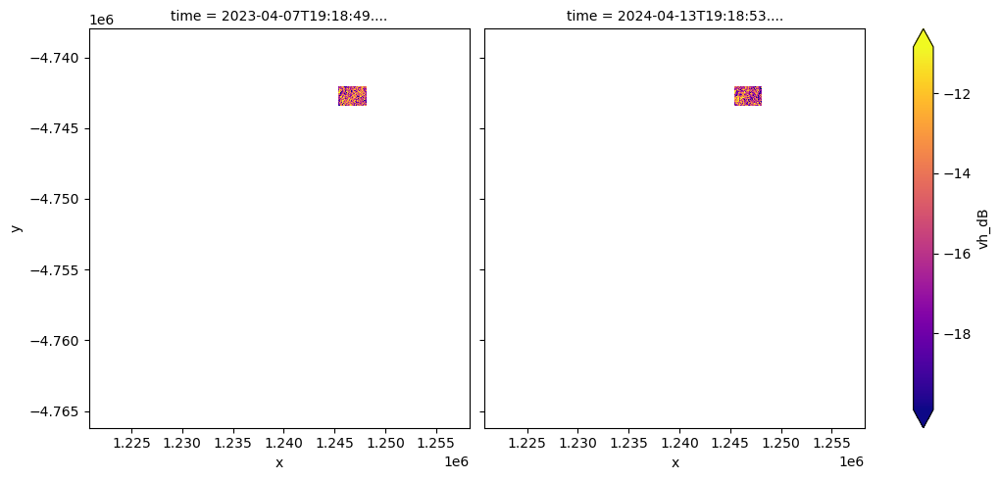

In [60]:
ds_training_2024_2023_masked.vh_dB.plot(size=5, cmap="plasma",robust = True, col= 'time')

### Class detection dataset

In [49]:
ds_2024_2023_masked.coords['time'].values

array(['2023-04-07T19:18:49.464162000', '2024-04-13T19:18:53.869223000'],
      dtype='datetime64[ns]')

In [67]:
ds_2023_training_masked

<xarray.Dataset> Size: 42MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
    time                 datetime64[ns] 8B 2023-04-07T19:18:49.464162
Data variables:
    deforestation_class  (y, x) float64 21MB nan nan nan nan ... nan nan nan nan
    vh_dB                (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vv_dB                (y, x) float32 11MB nan nan nan nan ... nan nan nan nan

In [73]:
#drop all nan values if in any of the datasets
df_training_2024 = ds_2024_training_masked.to_dataframe().dropna() 
df_training_2024 = df_training_2024.reset_index() #convert indexes into normal columns

#####
df_training_2023 = ds_2023_training_masked.to_dataframe().dropna() 
df_training_2023 = df_training_2023.reset_index()

In [75]:
df_training_2024

,y,x,deforestation_class,vh_dB,vv_dB,spatial_ref,time
0,-4742070.0,1245430.0,2.0,-15.229033,-9.531662,3577,2024-04-13 19:18:53.869223
1,-4742070.0,1245450.0,2.0,-13.693535,-7.900548,3577,2024-04-13 19:18:53.869223
2,-4742070.0,1245470.0,2.0,-13.266731,-6.141993,3577,2024-04-13 19:18:53.869223
3,-4742070.0,1245490.0,2.0,-14.968654,-7.870847,3577,2024-04-13 19:18:53.869223
4,-4742070.0,1245510.0,2.0,-15.062033,-7.601338,3577,2024-04-13 19:18:53.869223
...,...,...,...,...,...,...,...
9311,-4743410.0,1248070.0,2.0,-15.066908,-11.693623,3577,2024-04-13 19:18:53.869223
9312,-4743410.0,1248090.0,2.0,-16.068642,-9.459173,3577,2024-04-13 19:18:53.869223
9313,-4743410.0,1248110.0,2.0,-13.789488,-7.756382,3577,2024-04-13 19:18:53.869223
9314,-4743410.0,1248130.0,2.0,-13.442549,-7.375827,3577,2024-04-13 19:18:53.869223


In [91]:
df_training_2024.to_csv('../Project/Outputs/Tas_S1RCT_test_normal_2024.csv', index=False)

In [92]:
df_training_2023.to_csv('../Project/Outputs/Tas_S1RCT_test_normal_2023.csv', index=False)

### Bi-temporal detection dataset

In [154]:
ds_training_2024_2023.coords['time'].values

array(['2023-04-07T19:18:49.464162000', '2024-04-13T19:18:53.869223000'],
      dtype='datetime64[ns]')

In [155]:
ds_2024_masked = ds_training_2024_2023_masked[['deforestation_class','vh_dB','vv_dB']].sel(time= '2024-04-13T19:18:53.869223000')
ds_2024_masked = ds_2024_masked.rename({'vh_dB': 't2024_vh_dB'})
ds_2024_masked = ds_2024_masked.rename({'vv_dB': 't2024_vv_dB'})
ds_2024_masked = ds_2024_masked.drop_vars('time')

In [156]:
ds_2023_masked = ds_training_2024_2023_masked[['vh_dB','vv_dB']].sel(time= '2023-04-07T19:18:49.464162000')
ds_2023_masked = ds_2023_masked.rename({'vh_dB': 't2023_vh_dB'})
ds_2023_masked = ds_2023_masked.rename({'vv_dB': 't2023_vv_dB'})
ds_2023_masked = ds_2023_masked.drop_vars('time')

In [157]:
ds_test_bitemporal = xr.merge([ds_2024_masked, ds_2023_masked])
#del ds_2023_masked, ds_2024_masked

In [158]:
ds_test_bitemporal

<xarray.Dataset> Size: 63MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  (y, x) float64 21MB nan nan nan nan ... nan nan nan nan
    t2024_vh_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    t2024_vv_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    t2023_vh_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    t2023_vv_dB          (y, x) float32 11MB nan nan nan nan ... nan nan nan nan

Add the label class

In [159]:
print('Total NaN values:',ds_test_bitemporal.isnull().sum(),
      '\n Total non-Nan values: ',ds_test_bitemporal.notnull().sum())

Total NaN values: <xarray.Dataset> Size: 44B
Dimensions:              ()
Coordinates:
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  int64 8B 2628794
    t2024_vh_dB          int64 8B 2628794
    t2024_vv_dB          int64 8B 2628794
    t2023_vh_dB          int64 8B 2628794
    t2023_vv_dB          int64 8B 2628794 
 Total non-Nan values:  <xarray.Dataset> Size: 44B
Dimensions:              ()
Coordinates:
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  int64 8B 9316
    t2024_vh_dB          int64 8B 9316
    t2024_vv_dB          int64 8B 9316
    t2023_vh_dB          int64 8B 9316
    t2023_vv_dB          int64 8B 9316


In [160]:
#drop all nan values if in any of the datasets
df_test_bitemporal = ds_test_bitemporal.to_dataframe().dropna() 
df_test_bitemporal = df_test_bitemporal.reset_index() #convert indexes into normal columns

In [161]:
df_test_bitemporal

,y,x,deforestation_class,t2024_vh_dB,t2024_vv_dB,spatial_ref,t2023_vh_dB,t2023_vv_dB
0,-4742070.0,1245430.0,2.0,-15.229033,-9.531662,3577,-17.410767,-9.820895
1,-4742070.0,1245450.0,2.0,-13.693535,-7.900548,3577,-12.504734,-8.221275
2,-4742070.0,1245470.0,2.0,-13.266731,-6.141993,3577,-10.834158,-8.255929
3,-4742070.0,1245490.0,2.0,-14.968654,-7.870847,3577,-13.174296,-7.236425
4,-4742070.0,1245510.0,2.0,-15.062033,-7.601338,3577,-14.643464,-4.803872
...,...,...,...,...,...,...,...,...
9311,-4743410.0,1248070.0,2.0,-15.066908,-11.693623,3577,-16.390623,-13.641013
9312,-4743410.0,1248090.0,2.0,-16.068642,-9.459173,3577,-13.911914,-9.601296
9313,-4743410.0,1248110.0,2.0,-13.789488,-7.756382,3577,-14.219471,-7.647258
9314,-4743410.0,1248130.0,2.0,-13.442549,-7.375827,3577,-13.052687,-7.660894


In [162]:
df_test_bitemporal.to_csv('../Project/Outputs/Tas_S1RCT_test_bitemporal_2024_2023.csv', index=False)

In [163]:
df_test_bitemporal.drop(columns=['x','y','spatial_ref'], inplace=True)
df_test_bitemporal

,deforestation_class,t2024_vh_dB,t2024_vv_dB,t2023_vh_dB,t2023_vv_dB
0,2.0,-15.229033,-9.531662,-17.410767,-9.820895
1,2.0,-13.693535,-7.900548,-12.504734,-8.221275
2,2.0,-13.266731,-6.141993,-10.834158,-8.255929
3,2.0,-14.968654,-7.870847,-13.174296,-7.236425
4,2.0,-15.062033,-7.601338,-14.643464,-4.803872
...,...,...,...,...,...
9311,2.0,-15.066908,-11.693623,-16.390623,-13.641013
9312,2.0,-16.068642,-9.459173,-13.911914,-9.601296
9313,2.0,-13.789488,-7.756382,-14.219471,-7.647258
9314,2.0,-13.442549,-7.375827,-13.052687,-7.660894


### Normal and bitemporal models to detect deforestation in between pairs of  images
(t1:2023 , t2:2024)

In [100]:
import joblib
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier

In [142]:
bitemporal_random_forest_classifier = joblib.load('../Project/Outputs/Classifiers/rf_bitemporal_model.joblib')

In [143]:
bitemporal_random_forest_classifier

RandomForestClassifier(max_features=3, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [144]:
bitemporal_random_forest_classifier.feature_importances_ #(t2_vh_dB,t2_vv_db,t1_vh_dB,t1_vv_db)

array([0.27123524, 0.24073024, 0.24103139, 0.24700313])

In [103]:
normal_random_forest_classifier = joblib.load('../Project/Outputs/Classifiers/rf_normal_class_model.joblib')

In [96]:
normal_random_forest_classifier

RandomForestClassifier(max_features=3, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [141]:
normal_random_forest_classifier.feature_importances_ #(vh_dB,vv_db)

array([0.62955853, 0.37044147])

#### Normal class detection classifier predictions

In [129]:
df_training_2023[['vh_dB', 'vv_dB']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9316 entries, 0 to 9315
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   vh_dB   9316 non-null   float32
 1   vv_dB   9316 non-null   float32
dtypes: float32(2)
memory usage: 72.9 KB


In [104]:
y_pred_2024 = normal_random_forest_classifier.predict(df_training_2024[['vh_dB', 'vv_dB']])

In [105]:
y_pred_2023 = normal_random_forest_classifier.predict(df_training_2023[['vh_dB', 'vv_dB']])

In [128]:
y_pred_2023

array([1., 2., 2., ..., 2., 2., 2.])

In [138]:
df_preds_normal_class = df_training_2024[['deforestation_class']].copy()
df_preds_normal_class['pred_2023'] = y_pred_2023
df_preds_normal_class['pred_2024'] = y_pred_2024
df_preds_normal_class['pred_2024_2023'] = df_preds_normal_class['pred_2024'] - df_preds_normal_class['pred_2023']
df_preds_normal_class['pred_2024_2023_relabeled'] = df_preds_normal_class['pred_2024_2023'].replace({-1: 1, 0: 2, 1: 2})

In [125]:
df_preds_normal_class['pred_2024_2023_relabeled'].unique()

array([2., 1.])

In [140]:
accuracy = accuracy_score(df_preds_normal_class['deforestation_class'], df_preds_normal_class['pred_2024_2023_relabeled']) #(y_test,y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(df_preds_normal_class['deforestation_class'], df_preds_normal_class['pred_2024_2023_relabeled'])) #(y_test,y_pred)

kappa = cohen_kappa_score(df_preds_normal_class['deforestation_class'], df_preds_normal_class['pred_2024_2023_relabeled'])
print(f'Kappa Accuracy: {kappa:.2f}')

Accuracy: 62.63%
              precision    recall  f1-score   support

         1.0       0.41      0.20      0.27      3209
         2.0       0.67      0.85      0.75      6107

    accuracy                           0.63      9316
   macro avg       0.54      0.52      0.51      9316
weighted avg       0.58      0.63      0.58      9316

Kappa Accuracy: 0.06


#### Bi-temporal predictions

In [165]:
df_test_bitemporal = df_test_bitemporal.rename(columns={
    't2024_vh_dB': 't2_vh_dB',
    't2024_vv_dB': 't2_vv_dB',
    't2023_vh_dB': 't1_vh_dB',
    't2023_vv_dB': 't1_vv_dB'
})
df_test_bitemporal

,deforestation_class,t2_vh_dB,t2_vv_dB,t1_vh_dB,t1_vv_dB
0,2.0,-15.229033,-9.531662,-17.410767,-9.820895
1,2.0,-13.693535,-7.900548,-12.504734,-8.221275
2,2.0,-13.266731,-6.141993,-10.834158,-8.255929
3,2.0,-14.968654,-7.870847,-13.174296,-7.236425
4,2.0,-15.062033,-7.601338,-14.643464,-4.803872
...,...,...,...,...,...
9311,2.0,-15.066908,-11.693623,-16.390623,-13.641013
9312,2.0,-16.068642,-9.459173,-13.911914,-9.601296
9313,2.0,-13.789488,-7.756382,-14.219471,-7.647258
9314,2.0,-13.442549,-7.375827,-13.052687,-7.660894


In [166]:
y_pred_2024_2023 = bitemporal_random_forest_classifier.predict(df_test_bitemporal[['t2_vh_dB','t2_vv_dB','t1_vh_dB','t1_vv_dB']])

In [171]:
df_test_bitemporal['pred_2024_2023'] = y_pred_2024_2023

In [176]:
#df_test_bitemporal['deforestation_class'] = df_test_bitemporal['deforestation_class'].replace(3,2)
df_test_bitemporal['deforestation_class'].unique()

array([2., 1.])

In [177]:
accuracy = accuracy_score(df_test_bitemporal['deforestation_class'], df_test_bitemporal['pred_2024_2023']) #(y_test,y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(classification_report(df_test_bitemporal['deforestation_class'], df_test_bitemporal['pred_2024_2023'])) #(y_test,y_pred)

kappa = cohen_kappa_score(df_test_bitemporal['deforestation_class'], df_test_bitemporal['pred_2024_2023'])
print(f'Kappa Accuracy: {kappa:.2f}')

Accuracy: 56.49%
              precision    recall  f1-score   support

         1.0       0.35      0.31      0.33      3209
         2.0       0.66      0.70      0.68      6107

    accuracy                           0.56      9316
   macro avg       0.51      0.51      0.50      9316
weighted avg       0.55      0.56      0.56      9316

Kappa Accuracy: 0.01


#### compare both models (mcnemar)

In [178]:
from sklearn.metrics import confusion_matrix
from statsmodels.stats.contingency_tables import mcnemar

# Compute confusion matrices
cm1 = confusion_matrix(df_preds_normal_class['deforestation_class'],df_preds_normal_class['pred_2024_2023_relabeled']) #(true_labels, preds1)
cm2 = confusion_matrix(df_test_bitemporal['deforestation_class'],df_test_bitemporal['pred_2024_2023']) #(true_labels, preds2)

# Perform McNemar's test
result = mcnemar([[cm1[1, 1], cm1[0, 1]], [cm1[1, 0], cm1[0, 0]]], exact=True)

print(f"Statistic: {result.statistic}, P-value: {result.pvalue}")

Statistic: 910.0, P-value: 2.3110423663075912e-181


The test compares the predictions from two models by looking at cases where:

* Model 1 gets it right and Model 2 gets it wrong (disagreements).
* Model 2 gets it right and Model 1 gets it wrong.
The null hypothesis of McNemar's test is that the proportions of these disagreements are the same, meaning that the two classifiers perform similarly.null hypothesis is rejected when p < 0.05